In [1]:
#Importing the libraries
import pandas as pd
import numpy as np
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import geopandas as gpd
import math

In [2]:
# Importing the dataset 
gdp_capita = pd.read_csv(r"C:\Users\btdjf\Desktop\Ironhack 2\Final Bootcamp Project\Final-Bootcamp-Project\Datasets\gdp_per_capita.csv")
gdp_capita

,"GDP, current prices (Billions of U.S. dollars)",1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,20.616,20.057,18.020,18.883,18.401,18.876,20.136,0.000,0.000,0.000
1,Albania,1.946,2.229,2.296,2.319,2.290,2.339,2.587,2.566,2.530,...,13.246,11.389,11.862,13.053,15.157,15.399,15.161,18.310,18.256,18.842
2,Algeria,42.346,44.372,44.780,47.529,51.513,61.132,61.535,63.300,51.664,...,213.810,165.979,160.034,170.207,175.372,171.680,144.922,162.711,187.155,190.254
3,Andorra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,3.267,2.789,2.895,2.993,3.217,3.155,2.885,3.330,3.302,3.360
4,Angola,6.639,6.214,6.214,6.476,6.864,8.457,7.918,9.050,9.818,...,145.712,116.194,101.124,122.022,101.353,84.516,58.125,75.179,124.794,135.558
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
227,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# Rename of the first column to country 
gdp_capita.rename(columns={'GDP, current prices (Billions of U.S. dollars)': 'Country'}, inplace=True)
gdp_capita

,Country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,20.616,20.057,18.020,18.883,18.401,18.876,20.136,0.000,0.000,0.000
1,Albania,1.946,2.229,2.296,2.319,2.290,2.339,2.587,2.566,2.530,...,13.246,11.389,11.862,13.053,15.157,15.399,15.161,18.310,18.256,18.842
2,Algeria,42.346,44.372,44.780,47.529,51.513,61.132,61.535,63.300,51.664,...,213.810,165.979,160.034,170.207,175.372,171.680,144.922,162.711,187.155,190.254
3,Andorra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,3.267,2.789,2.895,2.993,3.217,3.155,2.885,3.330,3.302,3.360
4,Angola,6.639,6.214,6.214,6.476,6.864,8.457,7.918,9.050,9.818,...,145.712,116.194,101.124,122.022,101.353,84.516,58.125,75.179,124.794,135.558
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
227,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Rename columns to lower case and replace spaces
cols = []
for i in range(len(gdp_capita.columns)):
    cols.append(gdp_capita.columns[i].lower().replace(' ', ''))
gdp_capita.columns = cols
gdp_capita

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,20.616,20.057,18.020,18.883,18.401,18.876,20.136,0.000,0.000,0.000
1,Albania,1.946,2.229,2.296,2.319,2.290,2.339,2.587,2.566,2.530,...,13.246,11.389,11.862,13.053,15.157,15.399,15.161,18.310,18.256,18.842
2,Algeria,42.346,44.372,44.780,47.529,51.513,61.132,61.535,63.300,51.664,...,213.810,165.979,160.034,170.207,175.372,171.680,144.922,162.711,187.155,190.254
3,Andorra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,3.267,2.789,2.895,2.993,3.217,3.155,2.885,3.330,3.302,3.360
4,Angola,6.639,6.214,6.214,6.476,6.864,8.457,7.918,9.050,9.818,...,145.712,116.194,101.124,122.022,101.353,84.516,58.125,75.179,124.794,135.558
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
227,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
#checking the struture of the dataset
gdp_capita.shape

(230, 45)

In [6]:
# Dropping from the row 196 until 230
gdp_capita.drop(range(196, 230), inplace=True)
gdp_capita

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,20.616,20.057,18.020,18.883,18.401,18.876,20.136,0.000,0.000,0.000
1,Albania,1.946,2.229,2.296,2.319,2.290,2.339,2.587,2.566,2.530,...,13.246,11.389,11.862,13.053,15.157,15.399,15.161,18.310,18.256,18.842
2,Algeria,42.346,44.372,44.780,47.529,51.513,61.132,61.535,63.300,51.664,...,213.810,165.979,160.034,170.207,175.372,171.680,144.922,162.711,187.155,190.254
3,Andorra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,3.267,2.789,2.895,2.993,3.217,3.155,2.885,3.330,3.302,3.360
4,Angola,6.639,6.214,6.214,6.476,6.864,8.457,7.918,9.050,9.818,...,145.712,116.194,101.124,122.022,101.353,84.516,58.125,75.179,124.794,135.558
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,Vietnam,35.357,17.617,23.369,35.204,61.171,19.045,43.009,53.385,29.501,...,232.888,236.795,252.146,277.071,303.091,327.873,342.941,366.201,413.808,469.620
192,West Bank and Gaza,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,13.990,13.972,15.405,16.128,16.277,17.134,15.532,18.037,18.818,19.398
193,Yemen,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,43.229,42.444,31.318,26.842,21.606,21.888,18.850,19.911,27.594,28.099
194,Zambia,4.246,4.385,4.232,3.653,3.003,2.848,1.962,2.431,4.095,...,27.145,21.245,20.965,25.874,26.312,23.309,18.111,21.313,27.025,28.798


In [7]:
# Checking a summary of the dataset to understand the structure and content of the dataset, as null values, and data types
gdp_capita.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 45 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   country  196 non-null    object 
 1   1980     196 non-null    float64
 2   1981     196 non-null    float64
 3   1982     196 non-null    float64
 4   1983     196 non-null    float64
 5   1984     196 non-null    float64
 6   1985     196 non-null    float64
 7   1986     196 non-null    float64
 8   1987     196 non-null    float64
 9   1988     196 non-null    float64
 10  1989     196 non-null    float64
 11  1990     196 non-null    float64
 12  1991     196 non-null    float64
 13  1992     196 non-null    float64
 14  1993     196 non-null    float64
 15  1994     196 non-null    float64
 16  1995     196 non-null    float64
 17  1996     196 non-null    float64
 18  1997     196 non-null    float64
 19  1998     196 non-null    float64
 20  1999     196 non-null    float64
 21  2000     196 non

In [8]:
# checking all the rows of the dataset
pd.set_option('display.max_rows', None)
print(gdp_capita)

                              country      1980      1981      1982      1983  \
0                         Afghanistan     0.000     0.000     0.000     0.000   
1                             Albania     1.946     2.229     2.296     2.319   
2                             Algeria    42.346    44.372    44.780    47.529   
3                             Andorra     0.000     0.000     0.000     0.000   
4                              Angola     6.639     6.214     6.214     6.476   
5                 Antigua and Barbuda     0.131     0.148     0.164     0.182   
6                           Argentina   233.696   189.802    94.250   116.267   
7                             Armenia     0.000     0.000     0.000     0.000   
8                               Aruba     0.000     0.000     0.000     0.000   
9                           Australia   162.821   188.290   186.930   179.364   
10                            Austria    80.923    70.121    70.111    71.032   
11                         A

In [9]:
# checking the null values of each feature
gdp_capita.isna().sum()

country    0
1980       0
1981       0
1982       0
1983       0
1984       0
1985       0
1986       0
1987       0
1988       0
1989       0
1990       0
1991       0
1992       0
1993       0
1994       0
1995       0
1996       0
1997       0
1998       0
1999       0
2000       0
2001       0
2002       0
2003       0
2004       0
2005       0
2006       0
2007       0
2008       0
2009       0
2010       0
2011       0
2012       0
2013       0
2014       0
2015       0
2016       0
2017       0
2018       0
2019       0
2020       0
2021       0
2022       0
2023       0
dtype: int64

In [10]:
# Checking duplicates 
gdp_capita.duplicated().sum()

0

In [11]:
# Checking statistics of the dataset
gdp_capita.describe().T

,count,mean,std,min,25%,50%,75%,max
1980,196.0,57.338077,240.113017,0.0,0.00000,2.6310,25.37550,2857.325
1981,196.0,58.664699,260.659304,0.0,0.00000,2.7545,25.90875,3207.025
1982,196.0,57.584796,265.846074,0.0,0.00000,2.7545,24.91450,3343.800
1983,196.0,59.127786,286.386716,0.0,0.00000,2.9100,24.99475,3634.025
1984,196.0,61.232923,313.352366,0.0,0.00000,2.9110,23.24950,4037.650
1985,196.0,63.933893,335.589357,0.0,0.02400,3.1085,21.78250,4339.000
1986,196.0,75.388209,375.354862,0.0,0.07525,3.0745,27.67375,4579.625
1987,196.0,86.801087,413.917627,0.0,0.08250,2.9915,32.78775,4855.250
1988,196.0,97.609214,459.752473,0.0,0.08625,3.2340,32.98325,5236.425
1989,196.0,102.692837,484.438418,0.0,0.10350,3.4125,38.04000,5641.600


In [12]:
# Checking the columns of the dataset 
gdp_capita.columns

Index(['country', '1980', '1981', '1982', '1983', '1984', '1985', '1986',
       '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995',
       '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004',
       '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013',
       '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022',
       '2023'],
      dtype='object')

In [13]:
# Checking unique values of each feature
gdp_capita.nunique()

country    196
1980       147
1981       145
1982       146
1983       146
1984       146
1985       148
1986       149
1987       147
1988       149
1989       150
1990       156
1991       155
1992       170
1993       172
1994       175
1995       179
1996       179
1997       182
1998       184
1999       183
2000       192
2001       193
2002       193
2003       194
2004       194
2005       195
2006       194
2007       195
2008       195
2009       195
2010       195
2011       196
2012       196
2013       195
2014       196
2015       195
2016       196
2017       196
2018       196
2019       196
2020       196
2021       193
2022       193
2023       191
dtype: int64

In [14]:
# Printing the dataset
gdp_capita

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,20.616,20.057,18.020,18.883,18.401,18.876,20.136,0.000,0.000,0.000
1,Albania,1.946,2.229,2.296,2.319,2.290,2.339,2.587,2.566,2.530,...,13.246,11.389,11.862,13.053,15.157,15.399,15.161,18.310,18.256,18.842
2,Algeria,42.346,44.372,44.780,47.529,51.513,61.132,61.535,63.300,51.664,...,213.810,165.979,160.034,170.207,175.372,171.680,144.922,162.711,187.155,190.254
3,Andorra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,3.267,2.789,2.895,2.993,3.217,3.155,2.885,3.330,3.302,3.360
4,Angola,6.639,6.214,6.214,6.476,6.864,8.457,7.918,9.050,9.818,...,145.712,116.194,101.124,122.022,101.353,84.516,58.125,75.179,124.794,135.558
5,Antigua and Barbuda,0.131,0.148,0.164,0.182,0.208,0.241,0.290,0.337,0.399,...,1.250,1.337,1.437,1.468,1.606,1.688,1.370,1.471,1.692,1.867
6,Argentina,233.696,189.802,94.250,116.267,130.544,98.599,118.565,121.561,142.386,...,563.614,642.464,556.774,643.861,524.431,451.815,389.064,486.702,630.698,643.797
7,Armenia,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,11.610,10.553,10.546,11.527,12.458,13.619,12.641,13.928,17.693,19.460
8,Aruba,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.791,2.963,2.984,3.092,3.202,3.369,2.610,3.126,3.499,3.676
9,Australia,162.821,188.290,186.930,179.364,197.011,174.274,181.362,212.964,270.916,...,1456.432,1233.112,1263.833,1381.986,1416.818,1386.697,1357.639,1635.255,1724.787,1787.948


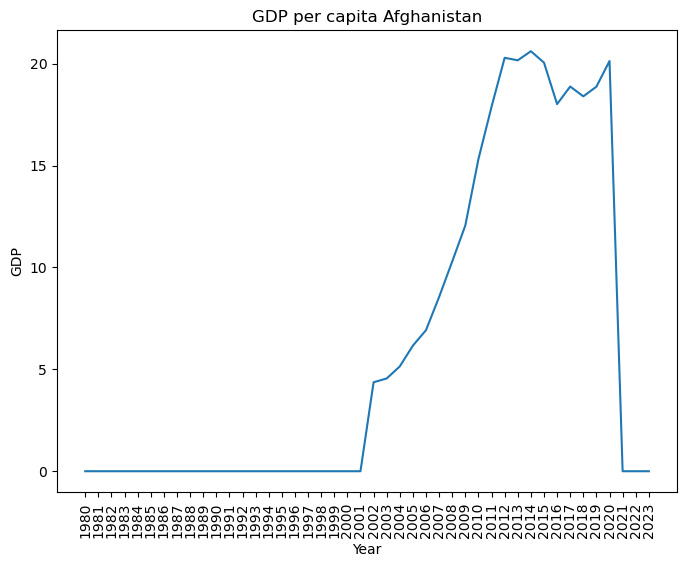

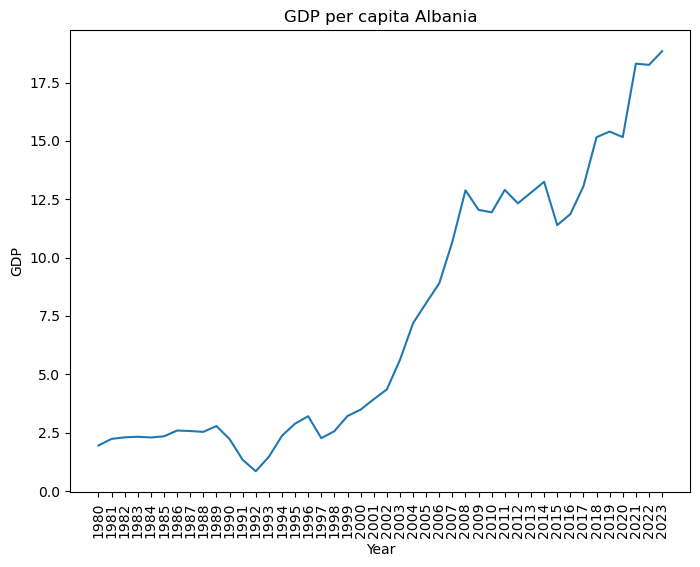

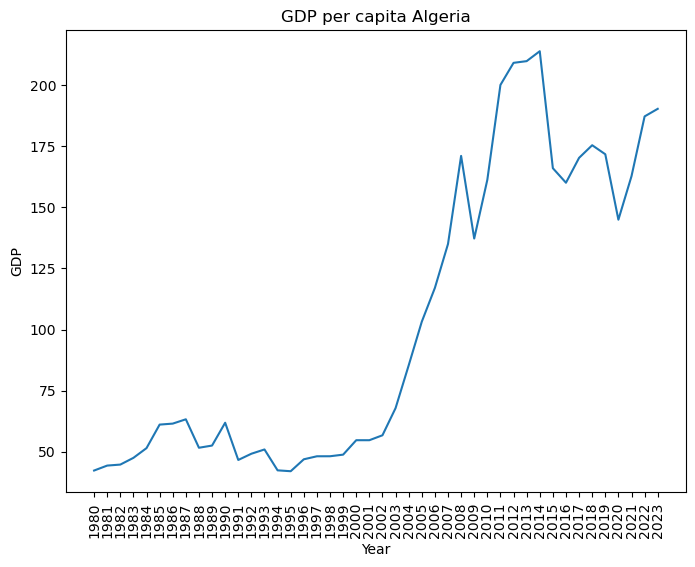

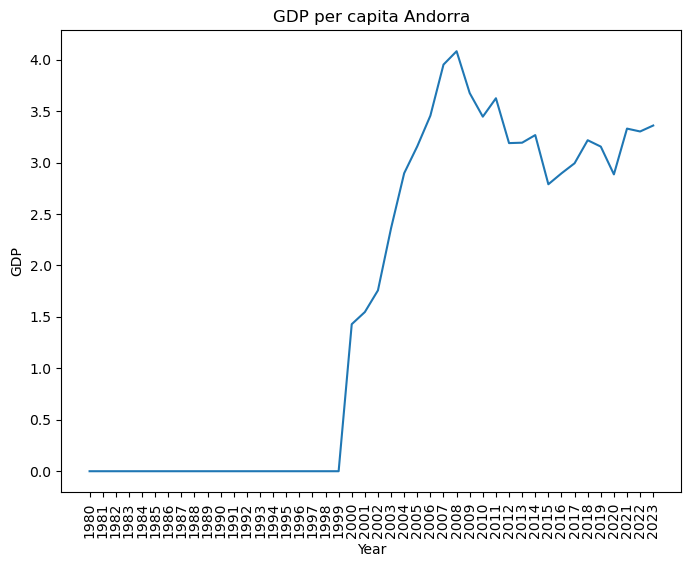

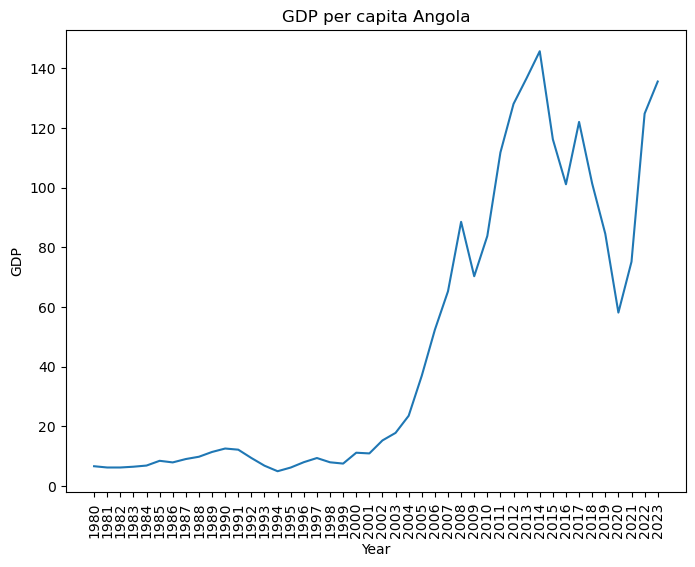

...

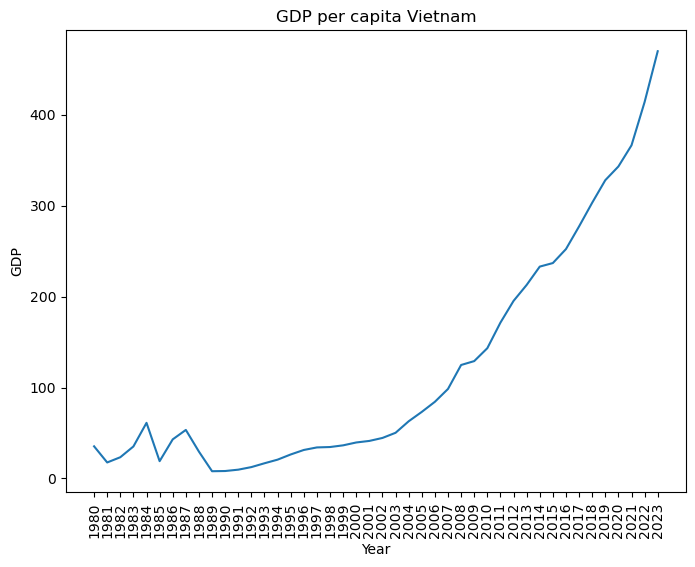

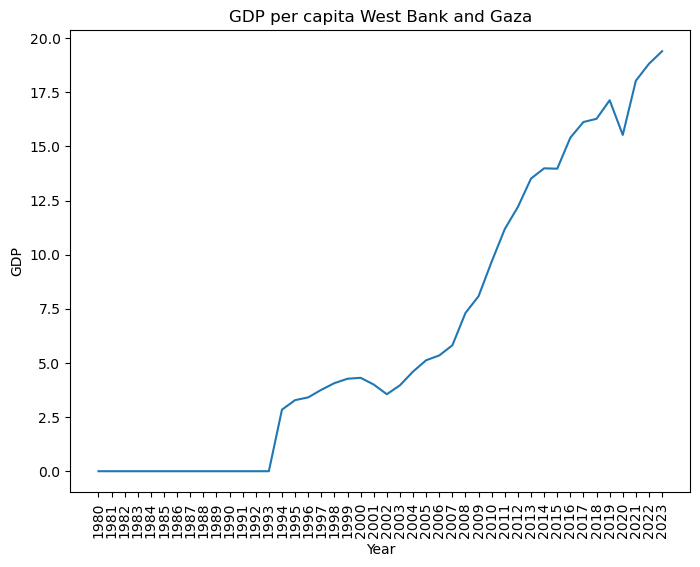

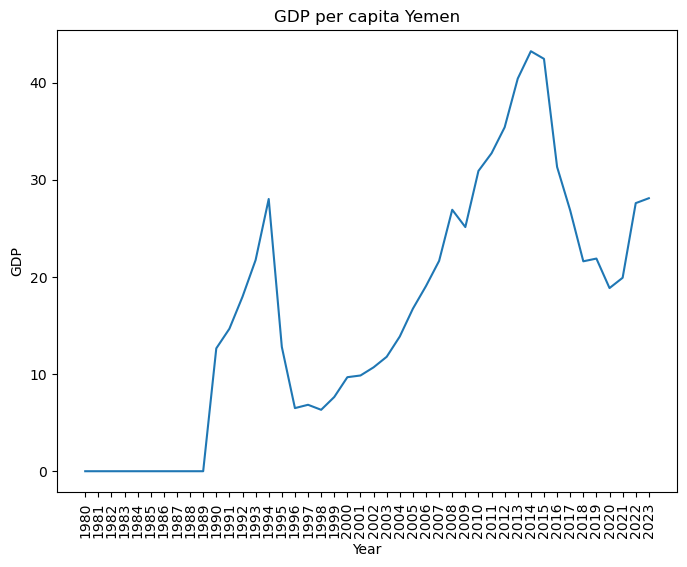

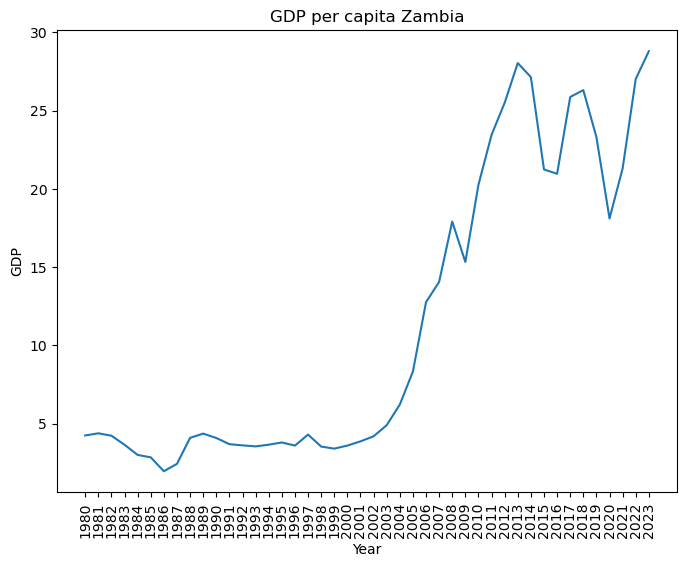

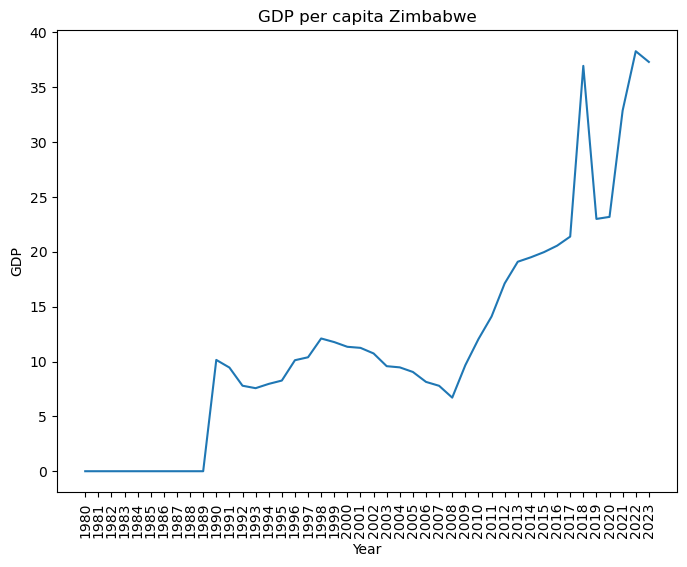

In [15]:
# Plotting the trend of GDP of each country 
for index, row in gdp_capita.iterrows():
    country_name = row['country']
    gdp_data = row.values[1:]

    plt.figure(figsize=(8, 6))
    plt.plot(gdp_capita.columns[1:], gdp_data)
    plt.title(f'GDP per capita {country_name}')
    plt.xlabel('Year')
    plt.ylabel('GDP')
    plt.xticks(rotation='vertical')
    plt.show()

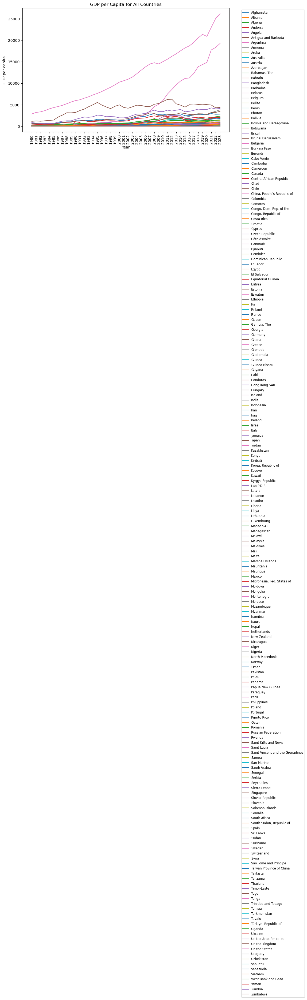

In [16]:
# ploting the GDP trend of all the countries
plt.figure(figsize=(10, 6))
for index, row in gdp_capita.iterrows():
    country_name = row['country']
    gdp_data = row.values[1:]

    plt.plot(gdp_capita.columns[1:], gdp_data, label=country_name)

plt.title('GDP per Capita for All Countries')
plt.xlabel('Year')
plt.ylabel('GDP per capita')
plt.xticks(rotation='vertical')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.tight_layout() 
plt.show()

In [17]:
# Printing the dataset 
gdp_capita

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,20.616,20.057,18.020,18.883,18.401,18.876,20.136,0.000,0.000,0.000
1,Albania,1.946,2.229,2.296,2.319,2.290,2.339,2.587,2.566,2.530,...,13.246,11.389,11.862,13.053,15.157,15.399,15.161,18.310,18.256,18.842
2,Algeria,42.346,44.372,44.780,47.529,51.513,61.132,61.535,63.300,51.664,...,213.810,165.979,160.034,170.207,175.372,171.680,144.922,162.711,187.155,190.254
3,Andorra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,3.267,2.789,2.895,2.993,3.217,3.155,2.885,3.330,3.302,3.360
4,Angola,6.639,6.214,6.214,6.476,6.864,8.457,7.918,9.050,9.818,...,145.712,116.194,101.124,122.022,101.353,84.516,58.125,75.179,124.794,135.558
5,Antigua and Barbuda,0.131,0.148,0.164,0.182,0.208,0.241,0.290,0.337,0.399,...,1.250,1.337,1.437,1.468,1.606,1.688,1.370,1.471,1.692,1.867
6,Argentina,233.696,189.802,94.250,116.267,130.544,98.599,118.565,121.561,142.386,...,563.614,642.464,556.774,643.861,524.431,451.815,389.064,486.702,630.698,643.797
7,Armenia,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,11.610,10.553,10.546,11.527,12.458,13.619,12.641,13.928,17.693,19.460
8,Aruba,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.791,2.963,2.984,3.092,3.202,3.369,2.610,3.126,3.499,3.676
9,Australia,162.821,188.290,186.930,179.364,197.011,174.274,181.362,212.964,270.916,...,1456.432,1233.112,1263.833,1381.986,1416.818,1386.697,1357.639,1635.255,1724.787,1787.948


In [18]:
# Extracting the dataset clean 
gdp_capita.to_excel('gdp_capita_clean.xlsx', index=False)

In [19]:
# Creating a new column with the sum of the avg of the growth and the last year 
avg_growth = gdp_capita.loc[:, '1981':'2022'].mean(axis=1)
sum_avg_growth_last_year = avg_growth + gdp_capita['2023']
gdp_capita['sum_avg_growth_last_year'] = sum_avg_growth_last_year
gdp_capita

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,sum_avg_growth_last_year
0,Afghanistan,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,20.057,18.020,18.883,18.401,18.876,20.136,0.000,0.000,0.000,6.351048
1,Albania,1.946,2.229,2.296,2.319,2.290,2.339,2.587,2.566,2.530,...,11.389,11.862,13.053,15.157,15.399,15.161,18.310,18.256,18.842,26.059762
2,Algeria,42.346,44.372,44.780,47.529,51.513,61.132,61.535,63.300,51.664,...,165.979,160.034,170.207,175.372,171.680,144.922,162.711,187.155,190.254,292.124119
3,Andorra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.789,2.895,2.993,3.217,3.155,2.885,3.330,3.302,3.360,5.017167
4,Angola,6.639,6.214,6.214,6.476,6.864,8.457,7.918,9.050,9.818,...,116.194,101.124,122.022,101.353,84.516,58.125,75.179,124.794,135.558,181.724976
5,Antigua and Barbuda,0.131,0.148,0.164,0.182,0.208,0.241,0.290,0.337,0.399,...,1.337,1.437,1.468,1.606,1.688,1.370,1.471,1.692,1.867,2.739690
6,Argentina,233.696,189.802,94.250,116.267,130.544,98.599,118.565,121.561,142.386,...,642.464,556.774,643.861,524.431,451.815,389.064,486.702,630.698,643.797,961.464000
7,Armenia,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,10.553,10.546,11.527,12.458,13.619,12.641,13.928,17.693,19.460,24.678048
8,Aruba,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.963,2.984,3.092,3.202,3.369,2.610,3.126,3.499,3.676,5.309976
9,Australia,162.821,188.290,186.930,179.364,197.011,174.274,181.362,212.964,270.916,...,1233.112,1263.833,1381.986,1416.818,1386.697,1357.639,1635.255,1724.787,1787.948,2530.498119


In [20]:
# Defining the X and y axis 
columns_to_drop = ['country','sum_avg_growth_last_year']
X = gdp_capita.drop(columns=columns_to_drop)
y = gdp_capita['sum_avg_growth_last_year']

In [21]:
# Spliting the X and y 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [22]:
# Testing the LR model
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)
predictions_lr = model_lr.predict(X_test)

In [23]:
# Printing predictions
predictions_lr

array([4.11433881e+02, 6.49190476e-01, 1.21703619e+02, 2.81143690e+02,
       6.26452381e+00, 5.39509983e+03, 2.79775952e+01, 5.41419286e+01,
       4.10638095e+00, 7.20571429e-01, 1.68524167e+02, 9.55854762e+00,
       1.11018333e+01, 4.64544652e+03, 2.21789048e+01, 1.84532619e+01,
       1.73009524e+00, 2.53049812e+03, 4.39824762e+01, 1.03242976e+02,
       2.20833824e+03, 1.40948571e+01, 1.04314950e+03, 1.00187190e+02,
       8.55664183e+03, 1.86373810e+00, 2.07820000e+01, 8.07068333e+02,
       3.91672857e+01, 1.27560119e+02, 7.41127381e+02, 8.62617619e+01,
       6.88620238e+01, 3.12332240e+03, 5.77682405e+02, 5.80467857e+01,
       7.43754762e+00, 2.50260000e+01, 5.49617143e+01, 4.18984286e+01])

In [24]:
# Testing the RF model
model_rf = RandomForestRegressor()
model_rf.fit(X_train, y_train)
predictions_rf = model_rf.predict(X_test)

In [25]:
# Printing predictions
predictions_rf

array([3.99133287e+02, 6.34402619e-01, 1.21694280e+02, 2.73489775e+02,
       7.11657810e+00, 7.19021553e+03, 2.61328933e+01, 5.68505805e+01,
       3.87287333e+00, 6.32930714e-01, 1.69754254e+02, 1.14270050e+01,
       9.63570214e+00, 6.79772541e+03, 2.22052967e+01, 1.95085024e+01,
       1.68617214e+00, 2.55965240e+03, 4.39300700e+01, 1.01747532e+02,
       2.36256284e+03, 1.32777519e+01, 1.01034941e+03, 1.02751164e+02,
       1.07984670e+04, 1.80364000e+00, 2.08172979e+01, 7.52271648e+02,
       4.30830021e+01, 1.34945264e+02, 6.88937017e+02, 9.94829821e+01,
       1.12471810e+02, 3.50868263e+03, 6.05456784e+02, 6.11753362e+01,
       8.51026024e+00, 2.50610664e+01, 5.97638683e+01, 4.30463698e+01])

In [26]:
# Testing the GB model
from sklearn.ensemble import GradientBoostingRegressor
model_gb = GradientBoostingRegressor()
model_gb.fit(X_train, y_train)
predictions_gb = model_gb.predict(X_test)

In [27]:
# Printing predictions
predictions_gb

array([3.71516980e+02, 1.98029136e+00, 1.21203775e+02, 3.08577291e+02,
       6.49253570e+00, 5.61768199e+03, 3.00587286e+01, 6.47861984e+01,
       4.26288007e+00, 1.94073008e+00, 1.83575348e+02, 1.20673253e+01,
       7.82220066e+00, 4.90103622e+03, 2.19855738e+01, 2.12920468e+01,
       2.24549820e+00, 2.56085037e+03, 4.06820807e+01, 1.07512512e+02,
       2.36661296e+03, 1.38152101e+01, 1.10619809e+03, 1.00055317e+02,
       1.26750839e+04, 2.45413860e+00, 2.12920468e+01, 7.72104335e+02,
       4.02413370e+01, 1.40197602e+02, 6.91971716e+02, 8.54231313e+01,
       9.03871247e+01, 3.17810852e+03, 6.06137558e+02, 6.47861984e+01,
       8.47540415e+00, 2.31084859e+01, 6.33751327e+01, 4.20931464e+01])

In [28]:
# Evaluating the LR model
mae_lr = mean_absolute_error(y_test, predictions_lr)
mse_lr = mean_squared_error(y_test, predictions_lr)
r2_lr = r2_score(y_test, predictions_lr)

In [29]:
# Evaluating the RF model
mae_rf = mean_absolute_error(y_test, predictions_rf)
mse_rf = mean_squared_error(y_test, predictions_rf)
r2_rf = r2_score(y_test, predictions_rf)

In [30]:
# Evaluating the GB model
mae_gb = mean_absolute_error(y_test, predictions_gb)
mse_gb = mean_squared_error(y_test, predictions_gb)
r2_gb = r2_score(y_test, predictions_gb)

In [31]:
# Printing the evaluations of the models
rmse_lr = np.sqrt(mean_squared_error(y_test, predictions_lr))
rmse_rf = np.sqrt(mean_squared_error(y_test, predictions_rf))
rmse_gb = np.sqrt(mean_squared_error(y_test, predictions_gb))

print("Linear Regression Metrics:")
print("Mean Absolute Error:", mae_lr)
print("Mean Squared Error:", mse_lr)
print("Root Mean Squared Error:", rmse_lr)
print("R-squared:", r2_lr)

print("\nRandom Forest Metrics:")
print("Mean Absolute Error:", mae_rf)
print("Mean Squared Error:", mse_rf)
print("Root Mean Squared Error:", rmse_rf)
print("R-squared:", r2_rf)

print("\nGradient Boosting Metrics:")
print("Mean Absolute Error:", mae_gb)
print("Mean Squared Error:", mse_gb)
print("Root Mean Squared Error:", rmse_gb)
print("R-squared:", r2_gb)

Linear Regression Metrics:
Mean Absolute Error: 1.308930741572567e-12
Mean Squared Error: 9.74916896347953e-24
Root Mean Squared Error: 3.1223659240197213e-12
R-squared: 1.0

Random Forest Metrics:
Mean Absolute Error: 176.00645988095175
Mean Squared Error: 326591.43002793577
Root Mean Squared Error: 571.4817845110514
R-squared: 0.8938056925320087

Gradient Boosting Metrics:
Mean Absolute Error: 129.67522692574886
Mean Squared Error: 427933.14195009787
Root Mean Squared Error: 654.1659896005737
R-squared: 0.8608534717273351


In [32]:
# Defining the X and the y axis
columns_to_drop = ['country', 'sum_avg_growth_last_year']
X = gdp_capita.drop(columns=columns_to_drop)
y = gdp_capita['sum_avg_growth_last_year']

In [33]:
# Applying the LR model to 2024
LR = RandomForestRegressor()
LR.fit(X, y)
predictions_2024 = LR.predict(X)

In [34]:
# Printing the predictions of 2024
predictions_2024

array([1.15573117e+01, 2.59448986e+01, 2.96819220e+02, 5.76466333e+00,
       1.80757585e+02, 2.76065667e+00, 9.76087815e+02, 2.46136819e+01,
       5.69567452e+00, 2.52282891e+03, 7.79478232e+02, 9.38330757e+01,
       2.08581960e+01, 6.27080640e+01, 5.99492127e+02, 9.77850619e+00,
       1.21251870e+02, 9.56299142e+02, 3.95164048e+00, 2.53274888e+01,
       3.79937214e+00, 6.24706838e+01, 3.45535107e+01, 2.69344286e+01,
       3.09864977e+03, 2.67048093e+01, 1.26492933e+02, 2.59414071e+01,
       5.54099405e+00, 3.21963429e+00, 4.04725602e+01, 6.80898333e+01,
       3.26503412e+03, 4.26494119e+00, 1.93492514e+01, 4.86838509e+02,
       1.82050336e+04, 5.38155643e+02, 2.01428667e+00, 9.92192079e+01,
       2.08071693e+01, 9.94798498e+01, 1.03487583e+02, 4.30418281e+01,
       4.13551869e+02, 1.00673079e+02, 6.14378063e+02, 5.09261833e+00,
       1.05564429e+00, 1.58937546e+02, 1.70878381e+02, 6.20459743e+02,
       4.59788883e+01, 2.18491883e+01, 3.57602476e+00, 5.54458271e+01,
      

In [35]:
# Converting the predictions of 2024 from exponencial to normal numbers and adding the new column of 2024
pred_2024 = np.round(predictions_2024, decimals=1)
gdp_capita['2024'] = pred_2024

In [36]:
# Printing the dataset
gdp_capita

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2016,2017,2018,2019,2020,2021,2022,2023,sum_avg_growth_last_year,2024
0,Afghanistan,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,18.020,18.883,18.401,18.876,20.136,0.000,0.000,0.000,6.351048,11.6
1,Albania,1.946,2.229,2.296,2.319,2.290,2.339,2.587,2.566,2.530,...,11.862,13.053,15.157,15.399,15.161,18.310,18.256,18.842,26.059762,25.9
2,Algeria,42.346,44.372,44.780,47.529,51.513,61.132,61.535,63.300,51.664,...,160.034,170.207,175.372,171.680,144.922,162.711,187.155,190.254,292.124119,296.8
3,Andorra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.895,2.993,3.217,3.155,2.885,3.330,3.302,3.360,5.017167,5.8
4,Angola,6.639,6.214,6.214,6.476,6.864,8.457,7.918,9.050,9.818,...,101.124,122.022,101.353,84.516,58.125,75.179,124.794,135.558,181.724976,180.8
5,Antigua and Barbuda,0.131,0.148,0.164,0.182,0.208,0.241,0.290,0.337,0.399,...,1.437,1.468,1.606,1.688,1.370,1.471,1.692,1.867,2.739690,2.8
6,Argentina,233.696,189.802,94.250,116.267,130.544,98.599,118.565,121.561,142.386,...,556.774,643.861,524.431,451.815,389.064,486.702,630.698,643.797,961.464000,976.1
7,Armenia,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,10.546,11.527,12.458,13.619,12.641,13.928,17.693,19.460,24.678048,24.6
8,Aruba,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.984,3.092,3.202,3.369,2.610,3.126,3.499,3.676,5.309976,5.7
9,Australia,162.821,188.290,186.930,179.364,197.011,174.274,181.362,212.964,270.916,...,1263.833,1381.986,1416.818,1386.697,1357.639,1635.255,1724.787,1787.948,2530.498119,2522.8


In [37]:
# Defining the X and the y axis
columns_to_drop = ['country', '2024','sum_avg_growth_last_year']
X = gdp_capita.drop(columns=columns_to_drop)
y = gdp_capita['2024']

In [38]:
# Applying the LR model to 2025
LR = LinearRegression()
LR.fit(X, y)
predictions_2025 = LR.predict(X)

In [39]:
# Printing the predictions of 2024
predictions_2025

array([3.26753822e+01, 2.74537630e+01, 2.31387704e+02, 1.43223930e+01,
       1.48107242e+02, 8.36521628e+00, 9.77799547e+02, 3.08382897e+01,
       9.43849094e+00, 2.51541385e+03, 7.36429318e+02, 8.10433127e+01,
       1.76959296e+01, 6.75609021e+01, 5.35379390e+02, 1.36539470e+01,
       1.59244419e+02, 9.31776848e+02, 9.55945735e+00, 2.91859576e+01,
       1.02870262e+01, 5.25339865e+01, 4.01560190e+01, 3.96244293e+01,
       3.11260428e+03, 3.54789213e+01, 1.93976171e+02, 2.93615395e+01,
       8.87459816e+00, 8.89488833e+00, 4.14559454e+01, 5.92344519e+01,
       3.22391862e+03, 7.12888109e+00, 3.02534333e+01, 4.65579905e+02,
       1.82094610e+04, 4.81847049e+02, 7.95787377e+00, 1.09694594e+02,
       3.11786716e+01, 1.05076857e+02, 1.26217813e+02, 4.86514671e+01,
       3.87829577e+02, 8.11073196e+01, 6.53947711e+02, 1.04854310e+01,
       6.94199509e+00, 1.41156673e+02, 1.51444343e+02, 6.33318966e+02,
       4.65031721e+01, 3.64234760e+01, 9.07653817e+00, 5.37351642e+01,
      

In [40]:
# Converting the predictions of 2025 from exponencial to normal numbers and adding the new column of 2025
pred_2025 = np.round(predictions_2025, decimals=1)
gdp_capita['2025'] = pred_2025

In [41]:
# Printing the dataset
gdp_capita

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2017,2018,2019,2020,2021,2022,2023,sum_avg_growth_last_year,2024,2025
0,Afghanistan,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,18.883,18.401,18.876,20.136,0.000,0.000,0.000,6.351048,11.6,32.7
1,Albania,1.946,2.229,2.296,2.319,2.290,2.339,2.587,2.566,2.530,...,13.053,15.157,15.399,15.161,18.310,18.256,18.842,26.059762,25.9,27.5
2,Algeria,42.346,44.372,44.780,47.529,51.513,61.132,61.535,63.300,51.664,...,170.207,175.372,171.680,144.922,162.711,187.155,190.254,292.124119,296.8,231.4
3,Andorra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.993,3.217,3.155,2.885,3.330,3.302,3.360,5.017167,5.8,14.3
4,Angola,6.639,6.214,6.214,6.476,6.864,8.457,7.918,9.050,9.818,...,122.022,101.353,84.516,58.125,75.179,124.794,135.558,181.724976,180.8,148.1
5,Antigua and Barbuda,0.131,0.148,0.164,0.182,0.208,0.241,0.290,0.337,0.399,...,1.468,1.606,1.688,1.370,1.471,1.692,1.867,2.739690,2.8,8.4
6,Argentina,233.696,189.802,94.250,116.267,130.544,98.599,118.565,121.561,142.386,...,643.861,524.431,451.815,389.064,486.702,630.698,643.797,961.464000,976.1,977.8
7,Armenia,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,11.527,12.458,13.619,12.641,13.928,17.693,19.460,24.678048,24.6,30.8
8,Aruba,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,3.092,3.202,3.369,2.610,3.126,3.499,3.676,5.309976,5.7,9.4
9,Australia,162.821,188.290,186.930,179.364,197.011,174.274,181.362,212.964,270.916,...,1381.986,1416.818,1386.697,1357.639,1635.255,1724.787,1787.948,2530.498119,2522.8,2515.4


In [42]:
# Dropping the column 'sum avg growth last year'
gdp_capita.drop('sum_avg_growth_last_year', axis=1, inplace=True)
gdp_capita

,country,1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
0,Afghanistan,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,18.020,18.883,18.401,18.876,20.136,0.000,0.000,0.000,11.6,32.7
1,Albania,1.946,2.229,2.296,2.319,2.290,2.339,2.587,2.566,2.530,...,11.862,13.053,15.157,15.399,15.161,18.310,18.256,18.842,25.9,27.5
2,Algeria,42.346,44.372,44.780,47.529,51.513,61.132,61.535,63.300,51.664,...,160.034,170.207,175.372,171.680,144.922,162.711,187.155,190.254,296.8,231.4
3,Andorra,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.895,2.993,3.217,3.155,2.885,3.330,3.302,3.360,5.8,14.3
4,Angola,6.639,6.214,6.214,6.476,6.864,8.457,7.918,9.050,9.818,...,101.124,122.022,101.353,84.516,58.125,75.179,124.794,135.558,180.8,148.1
5,Antigua and Barbuda,0.131,0.148,0.164,0.182,0.208,0.241,0.290,0.337,0.399,...,1.437,1.468,1.606,1.688,1.370,1.471,1.692,1.867,2.8,8.4
6,Argentina,233.696,189.802,94.250,116.267,130.544,98.599,118.565,121.561,142.386,...,556.774,643.861,524.431,451.815,389.064,486.702,630.698,643.797,976.1,977.8
7,Armenia,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,10.546,11.527,12.458,13.619,12.641,13.928,17.693,19.460,24.6,30.8
8,Aruba,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,2.984,3.092,3.202,3.369,2.610,3.126,3.499,3.676,5.7,9.4
9,Australia,162.821,188.290,186.930,179.364,197.011,174.274,181.362,212.964,270.916,...,1263.833,1381.986,1416.818,1386.697,1357.639,1635.255,1724.787,1787.948,2522.8,2515.4


In [43]:
# Extracting the dataset to an excel file
gdp_capita.to_excel('gdp_capita_pred_24_25.xlsx', index=False)

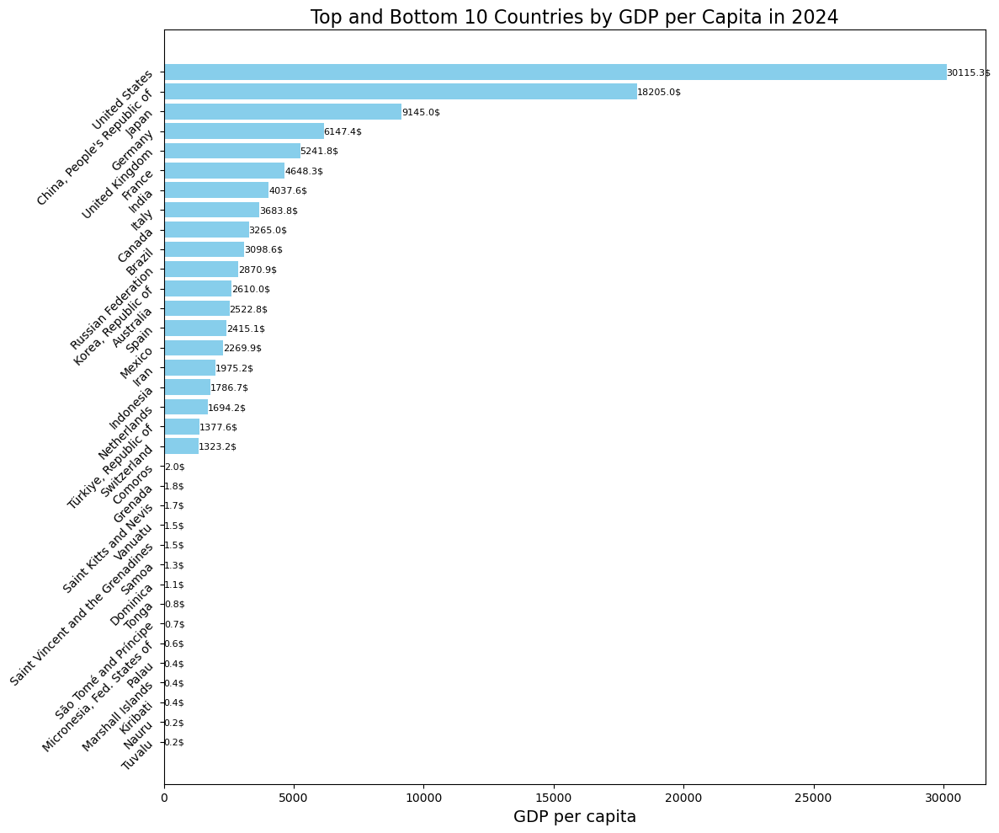

In [44]:
# Plotting the top 10 and bottom of 2024
gdp_capita.sort_values(by="2024", ascending=False, inplace=True)
top_bottom_10 = pd.concat([gdp_capita.head(20), gdp_capita.tail(15)])
plt.figure(figsize=(12, 10))
bars = plt.barh(top_bottom_10['country'], top_bottom_10['2024'], color='skyblue')


plt.xlabel('GDP per capita', fontsize=14)
plt.title('Top and Bottom 10 Countries by GDP per Capita in 2024', fontsize=16)
plt.gca().invert_yaxis()  


plt.yticks(fontsize=10, rotation=45)


for bar in bars:
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height()/2, '{:.1f}$'.format(width), ha='left', va='center', fontsize=8)

plt.tight_layout()
plt.savefig('GDP_Per_Capita_2024.png')
plt.show()

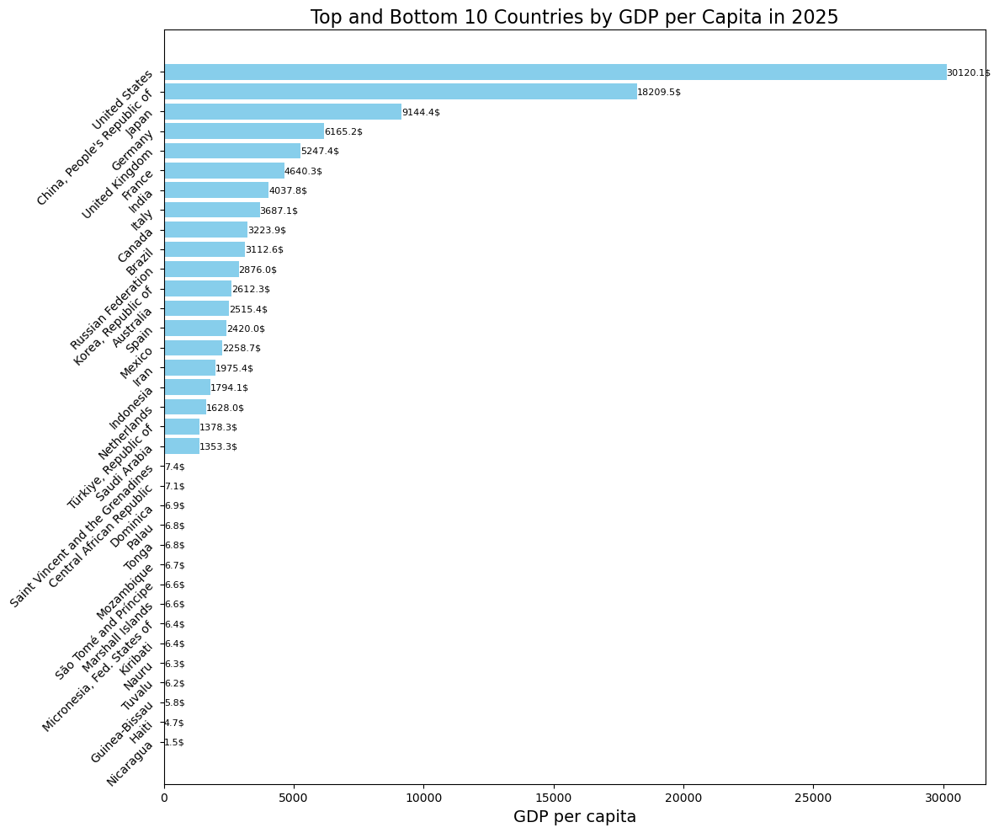

In [45]:
# Plotting the top 10 and bottom of 2025
gdp_capita.sort_values(by="2025", ascending=False, inplace=True)
top_bottom_10 = pd.concat([gdp_capita.head(20), gdp_capita.tail(15)])
plt.figure(figsize=(12, 10))
bars = plt.barh(top_bottom_10['country'], top_bottom_10['2025'], color='skyblue')


plt.xlabel('GDP per capita', fontsize=14)
plt.title('Top and Bottom 10 Countries by GDP per Capita in 2025', fontsize=16)
plt.gca().invert_yaxis()  


plt.yticks(fontsize=10, rotation=45)


for bar in bars:
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height()/2, '{:.1f}$'.format(width), ha='left', va='center', fontsize=8)

plt.tight_layout()
plt.savefig('GDP_Per_Capita_2025.png')
plt.show()

In [46]:
#Changing the format of the table, creating a new column with all the years 
gdp_capita_pivot = pd.melt(gdp_capita, id_vars=['country'], var_name='year', value_name='gdp_capita')
gdp_capita_pivot = gdp_capita_pivot.sort_values(by='country')
gdp_capita_pivot

,country,year,gdp_capita
1296,Afghanistan,1986,0.000
3452,Afghanistan,1997,0.000
4432,Afghanistan,2002,4.367
4824,Afghanistan,2004,5.146
708,Afghanistan,1983,0.000
6196,Afghanistan,2011,17.890
7176,Afghanistan,2016,18.020
5020,Afghanistan,2005,6.167
3256,Afghanistan,1996,0.000
5216,Afghanistan,2006,6.925


In [47]:
# Sorting the dataset by country and year
gdp_capita_pivot = gdp_capita_pivot.sort_values(by=['country','year'])
gdp_capita_pivot

,country,year,gdp_capita
120,Afghanistan,1980,0.000
316,Afghanistan,1981,0.000
512,Afghanistan,1982,0.000
708,Afghanistan,1983,0.000
904,Afghanistan,1984,0.000
1100,Afghanistan,1985,0.000
1296,Afghanistan,1986,0.000
1492,Afghanistan,1987,0.000
1688,Afghanistan,1988,0.000
1884,Afghanistan,1989,0.000


In [48]:
# Extracting the dataset to an excel file
gdp_capita_pivot.to_excel('gdp_capita_pivot.xlsx', index=False)